In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing
plt.style.use('ggplot')

train = pd.read_csv('../data/train.csv', index_col=0)
train.columns
train.shape

MSZoningMask = (train.MSZoning=='A') | (train.MSZoning=='C') | (train.MSZoning=='I') | (train.MSZoning=='C (all)')
train = train[~MSZoningMask]


In [3]:
train = train.fillna(value=0)

In [4]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 1500)
train.sample(10)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
920,20,RL,87.0,11029,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,8,1958,2002,Hip,CompShg,MetalSd,MetalSd,None,0.0,Ex,TA,CBlock,Gd,TA,No,ALQ,528,BLQ,411,245,1184,GasA,Ex,Y,SBrkr,1414,0,0,1414,1,0,1,0,3,1,TA,6,Min1,1,TA,Attchd,1990.0,Unf,2,601,TA,TA,Y,0,51,0,0,190,0,0,0,0,0,5,2008,WD,Normal,176500
959,20,RL,65.0,8450,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,699,Unf,0,638,1337,GasA,Ex,Y,SBrkr,1337,0,0,1337,1,0,2,0,3,1,Gd,6,Typ,0,0,Attchd,2003.0,RFn,2,531,TA,TA,Y,0,39,0,0,0,0,0,0,0,0,10,2007,WD,Normal,185000
457,70,RM,34.0,4571,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,5,5,1916,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,624,624,GasA,Fa,N,SBrkr,624,720,0,1344,0,0,1,0,4,1,TA,7,Typ,0,0,Detchd,1916.0,Unf,3,513,Fa,Fa,Y,0,0,96,0,0,0,0,0,0,0,5,2008,COD,Abnorml,98000
1215,85,RL,69.0,10205,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,SFoyer,5,5,1962,1962,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Av,BLQ,784,Unf,0,141,925,GasA,TA,Y,SBrkr,999,0,0,999,1,0,1,0,3,1,TA,6,Typ,0,0,Attchd,1962.0,Unf,1,300,TA,TA,Y,150,72,0,0,0,0,0,0,0,0,5,2006,WD,Normal,134500
935,20,RL,313.0,27650,Pave,0,IR2,HLS,AllPub,Inside,Mod,NAmes,PosA,Norm,1Fam,1Story,7,7,1960,2007,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,Gd,TA,Gd,GLQ,425,Unf,0,160,585,GasA,Ex,Y,SBrkr,2069,0,0,2069,1,0,2,0,4,1,Gd,9,Typ,1,Gd,Attchd,1960.0,RFn,2,505,TA,TA,Y,0,0,0,0,0,0,0,0,0,0,11,2008,WD,Normal,242000
1240,20,RL,64.0,9037,Pave,0,IR1,HLS,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,8,5,2006,2006,Hip,CompShg,VinylSd,VinylSd,BrkFace,32.0,Gd,TA,PConc,Gd,TA,Av,GLQ,428,Unf,0,1048,1476,GasA,Ex,Y,SBrkr,1484,0,0,1484,0,0,2,0,2,1,Ex,6,Typ,1,Gd,Attchd,2006.0,RFn,2,472,TA,TA,Y,120,33,0,0,0,0,0,0,0,0,12,2007,WD,Normal,265900
571,90,RL,74.0,13101,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,1Story,5,5,1965,1965,Gable,CompShg,HdBoard,HdBoard,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,LwQ,231,Unf,0,1497,1728,GasA,TA,Y,SBrkr,1728,0,0,1728,0,0,2,0,6,2,TA,10,Typ,0,0,Detchd,1987.0,Unf,2,576,TA,TA,Y,0,0,0,0,0,0,0,0,0,0,11,2008,WD,Normal,142600
581,20,RL,0.0,14585,Pave,0,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1960,1987,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,85.0,TA,TA,CBlock,TA,TA,No,BLQ,594,Rec,219,331,1144,GasA,Ex,Y,SBrkr,1429,0,0,1429,0,1,1,0,3,1,Gd,7,Typ,2,Gd,Attchd,1960.0,Unf,2,572,TA,TA,Y,216,110,0,0,0,0,0,0,0,0,6,2007,WD,Normal,181900
1299,60,RL,313.0,63887,Pave,0,IR3,Bnk,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,2Story,10,5,2008,2008,Hip,ClyTile,Stucco,Stucco,Stone,796.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,5644,Unf,0,466,6110,GasA,Ex,Y,SBrkr,4692,950,0,5642,2,0,2,1,3,1,Ex,12,Typ,3,Gd,Attchd,2008.0,Fin,2,1418,TA,TA,Y,214,292,0,0,0,480,Gd,0,0,0,1,2008,New,Partial,160000


In [5]:
num_vals = [x for x in train.columns if train[x].dtype == 'int64' or train[x].dtype == 'float64'] 
num_df = train[num_vals]
num_df = num_df.iloc[:,1:]
#num_df.isnull().sum()



In [6]:
num_df.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1450.00000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,57.54000,10523.831724,6.114483,5.582069,1971.593103,1985.049655,103.828276,445.162759,46.870345,567.375862,1059.408966,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,6.522069,0.616552,1870.826207,1.770345,473.277931,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,43.365517,6.312414,2007.812414,181654.942069
std,34.71992,10012.185355,1.372860,1.107330,30.022696,20.552319,181.150114,456.353871,161.828458,442.584978,439.207322,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,1.625324,0.644991,449.875634,0.745136,212.687621,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,497.636495,2.698244,1.326321,79176.485241
min,0.00000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,41.25000,7544.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.500000,0.000000,0.000000,1131.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1958.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,63.00000,9496.000000,6.000000,5.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1977.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163945.000000
75%,79.00000,11613.500000,7.000000,6.000000,2001.000000,2004.000000,166.000000,713.750000,0.000000,808.000000,1301.500000,1392.000000,728.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,313.00000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


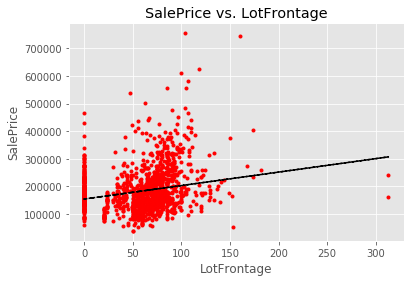

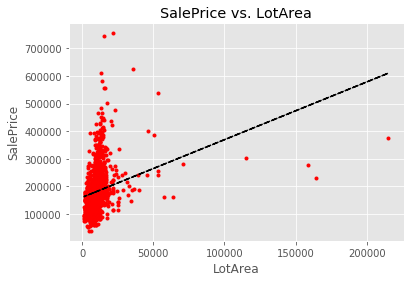

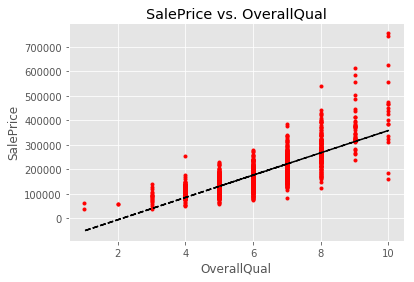

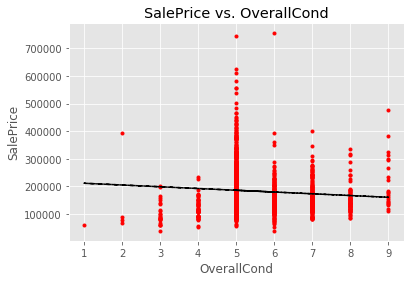

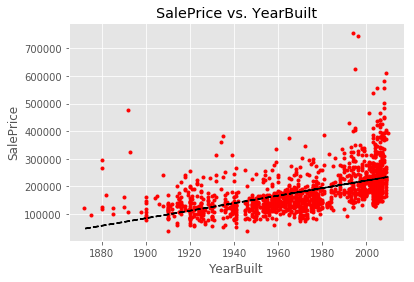

...

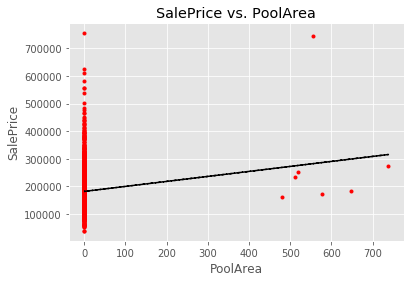

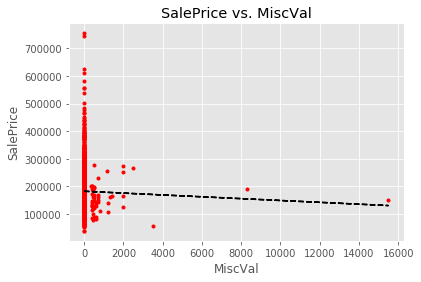

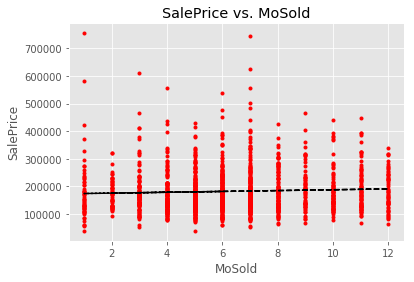

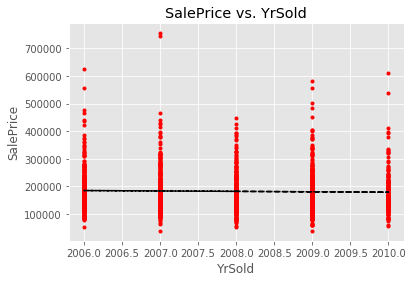

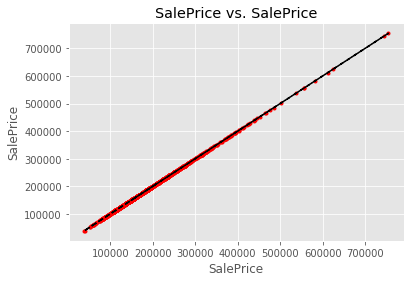

In [7]:
# Create Scatter Plots

for col in num_df.columns:
    
    x = num_df[col]
    y = num_df['SalePrice']
    
    # Plot
#     plt.scatter(x, y, marker=".", c = "blue")
    
    # Lables
    plt.title('SalePrice vs. ' + col)
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    
    # Fit Line
    m,b = np.polyfit(x, y, 1)
    
    # Plot
    plt.plot(x, y, 'r.', x, m*x+b, '--k') 
    
    plt.show()



In [8]:
vars(num_df)


{'_is_copy': None, '_data': BlockManager
 Items: Index(['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt',
        'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
        'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
        'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
        'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
        'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
        'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
        'MoSold', 'YrSold', 'SalePrice'],
       dtype='object')
 Axis 1: Int64Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
             ...
             1451, 1452, 1453, 1454, 1455, 1456, 1457, 1458, 1459, 1460],
            dtype='int64', name='Id', length=1450)
 FloatBlock: [0, 6, 23], 3 x 1450, dtype: float64
 IntBlock: [1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 

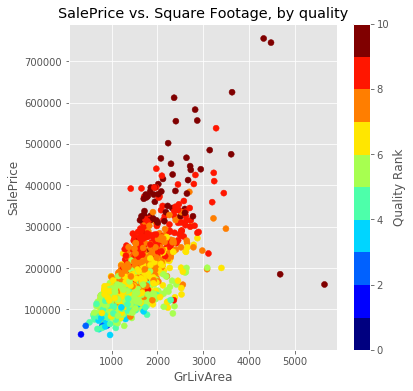

In [9]:
import matplotlib as mpl

x = num_df['GrLivArea']
y = num_df['SalePrice']
tag = num_df['OverallQual']

    
    # Plot
fig, ax = plt.subplots(1,1, figsize=(6,6))


N = 10 # Number of labels
cmap = plt.cm.jet
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

# define the bins and normalize
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# make the scatter
scat = ax.scatter(x,y,c=tag,cmap=cmap,norm=norm)
# create the colorbar
cb = plt.colorbar(scat)
cb.set_label('Quality Rank')
ax.set_title('SalePrice vs. Square Footage, by quality')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')


plt.show()

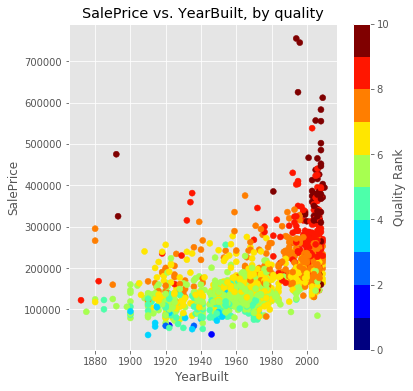

In [10]:
import matplotlib as mpl

x = num_df['YearBuilt']
y = num_df['SalePrice']
tag = num_df['OverallQual']

    
    # Plot
fig, ax = plt.subplots(1,1, figsize=(6,6))


N = 10 # Number of labels
cmap = plt.cm.jet
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

# define the bins and normalize
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# make the scatter
scat = ax.scatter(x,y,c=tag,cmap=cmap,norm=norm)
# create the colorbar
cb = plt.colorbar(scat)
cb.set_label('Quality Rank')
ax.set_title('SalePrice vs. YearBuilt, by quality')
plt.xlabel('YearBuilt')
plt.ylabel('SalePrice')


plt.show()

ValueError: 'c' argument must either be valid as mpl color(s) or as numbers to be mapped to colors. Here c = Id
1       CollgCr
2       Veenker
3       CollgCr
4       Crawfor
5       NoRidge
6       Mitchel
7       Somerst
8        NWAmes
9       OldTown
10      BrkSide
11       Sawyer
12      NridgHt
13       Sawyer
14      CollgCr
15        NAmes
16      BrkSide
17        NAmes
18       Sawyer
19      SawyerW
20        NAmes
21      NridgHt
22       IDOTRR
23      CollgCr
24      MeadowV
25       Sawyer
26      NridgHt
27        NAmes
28      NridgHt
29        NAmes
30      BrkSide
32       Sawyer
33      CollgCr
34        NAmes
35      NridgHt
36      NridgHt
37      CollgCr
38        NAmes
39        NAmes
40      Edwards
41        NAmes
42       Timber
43      SawyerW
44      CollgCr
45        NAmes
46      NridgHt
47      Mitchel
48      Somerst
49      OldTown
50       Sawyer
51      Gilbert
52      BrkSide
53       IDOTRR
54      Veenker
55        NAmes
56        NAmes
57      Somerst
58      CollgCr
59      StoneBr
60      CollgCr
61      SawyerW
62       IDOTRR
63      NridgHt
64      OldTown
65      CollgCr
66      NridgHt
67        NAmes
68      CollgCr
69      OldTown
70      ClearCr
71        NAmes
72      Mitchel
73      Gilbert
74        NAmes
75      OldTown
76      MeadowV
77        NAmes
78      BrkSide
79       Sawyer
80      OldTown
81        NAmes
82      Mitchel
83      Somerst
84        NAmes
85      Gilbert
86      NoRidge
87      Gilbert
88      Somerst
90      CollgCr
91        NAmes
92        NAmes
93      Crawfor
95      CollgCr
96      Gilbert
97      CollgCr
98      Edwards
99      Edwards
100       NAmes
101      NWAmes
102     SawyerW
103     SawyerW
104     CollgCr
105      IDOTRR
106     Somerst
107     OldTown
108     OldTown
109      IDOTRR
110      NWAmes
111     Edwards
112     Gilbert
113     CollgCr
114     Crawfor
115     Crawfor
116     Somerst
117      Sawyer
118     Edwards
119     SawyerW
120     CollgCr
121     ClearCr
122      IDOTRR
123       NAmes
124     SawyerW
125      NWAmes
126      IDOTRR
127     NPkVill
128     OldTown
129       NAmes
130       NAmes
131       NAmes
132     Gilbert
133       NAmes
134      Timber
135      Sawyer
136      NWAmes
137       NAmes
138     Mitchel
139     CollgCr
140     CollgCr
141       NAmes
142     CollgCr
143       NAmes
144     CollgCr
145      Sawyer
146     Edwards
147     BrkSide
148     Gilbert
149     SawyerW
150     BrkSide
151     CollgCr
152     NridgHt
153      NWAmes
154     ClearCr
155     OldTown
156     Edwards
157       NAmes
158      Timber
159     Somerst
160     Gilbert
161     Veenker
162     NridgHt
163     NridgHt
164     OldTown
165     OldTown
166     Edwards
167     ClearCr
168     NridgHt
169     Gilbert
170      Timber
171     OldTown
172       NAmes
173     StoneBr
174       NAmes
175      Timber
176     Edwards
177     ClearCr
178      Sawyer
179     StoneBr
180     OldTown
181     Somerst
182     Crawfor
183     Edwards
184     OldTown
185     BrkSide
186     OldTown
187     Mitchel
188     OldTown
189     SawyerW
190     StoneBr
191     Crawfor
192       NAmes
193     CollgCr
194     Edwards
195     CollgCr
196     NPkVill
197     Somerst
198       NAmes
199     OldTown
200     NridgHt
201     Edwards
202     Mitchel
203     OldTown
204     CollgCr
205     OldTown
206     Gilbert
207      Sawyer
208       NAmes
209     SawyerW
210       NAmes
211     Edwards
212     Edwards
213     Somerst
214     CollgCr
215     CollgCr
216       NAmes
217     CollgCr
218     OldTown
219     Crawfor
220     Blmngtn
221     CollgCr
222     Gilbert
223      NWAmes
224       NAmes
225     NridgHt
226      BrDale
227     NoRidge
228      BrDale
229      Sawyer
230     Blmngtn
231       NAmes
232     NoRidge
233      BrDale
234     CollgCr
235     Gilbert
236      BrDale
237     CollgCr
238     SawyerW
239     NridgHt
240     Edwards
241     Somerst
242     OldTown
243     OldTown
244     SawyerW
245     SawyerW
246      NWAmes
247     OldTown
248       NAmes
249     CollgCr
250     ClearCr
251     BrkSide
252     Crawfor
253     SawyerW
254       NAmes
255       NAmes
256     Gilbert
257     Somerst
258     CollgCr
259     CollgCr
260     OldTown
261       NAmes
262     CollgCr
263      Sawyer
264     OldTown
265     OldTown
266      NWAmes
267     Gilbert
268       SWISU
269      IDOTRR
270     Edwards
271     Somerst
272     ClearCr
273     NoRidge
274       NAmes
275     Mitchel
276     BrkSide
277     Mitchel
278     Gilbert
279     NridgHt
280     ClearCr
281     SawyerW
282     Somerst
283     NridgHt
284     Somerst
285     SawyerW
286     Somerst
287       NAmes
288       NAmes
289      Sawyer
290     BrkSide
291     CollgCr
292       SWISU
293     Edwards
294      NWAmes
295       NAmes
296     Mitchel
297      IDOTRR
298     Somerst
299      NWAmes
300     Crawfor
301     Crawfor
302     CollgCr
303     CollgCr
304     CollgCr
305     OldTown
306     CollgCr
307     SawyerW
308      IDOTRR
309     Edwards
310     NridgHt
311     Gilbert
312       NAmes
313     OldTown
314      Timber
315     OldTown
316     Gilbert
317      NWAmes
318     Somerst
319     NoRidge
320      NWAmes
321     NridgHt
322     NridgHt
323     SawyerW
324     OldTown
325       NAmes
326      IDOTRR
327     Veenker
328       NAmes
329     BrkSide
330      IDOTRR
331       NAmes
332       NAmes
333     NridgHt
334     NridgHt
335     Gilbert
336      Timber
337     StoneBr
338     CollgCr
339      NWAmes
340       NAmes
341      Timber
342     SawyerW
343       NAmes
344     NridgHt
345     MeadowV
346     BrkSide
347       NAmes
348       NAmes
349     NridgHt
350     NridgHt
351     NridgHt
352     ClearCr
353     Edwards
354     OldTown
355       SWISU
356     CollgCr
357     Gilbert
358     MeadowV
359     ClearCr
360     NoRidge
361     Mitchel
362     BrkSide
363     Edwards
364      BrDale
365      NWAmes
366      IDOTRR
367       NAmes
368       NAmes
369       NAmes
370       NAmes
371     Gilbert
372     ClearCr
373     SawyerW
374       NAmes
375     CollgCr
376     Edwards
377     CollgCr
378     Somerst
379     StoneBr
380     Gilbert
381       SWISU
382     Somerst
383     CollgCr
384     SawyerW
385     ClearCr
386     Blmngtn
387     Edwards
388     Edwards
389     CollgCr
390     NridgHt
391     Edwards
392     Mitchel
393       NAmes
394     BrkSide
395     OldTown
396     Edwards
397     CollgCr
398       NAmes
399      IDOTRR
400     Somerst
401     Veenker
402     CollgCr
403      Sawyer
404     NoRidge
405     Gilbert
406      Sawyer
407       SWISU
408     Crawfor
409     NridgHt
410     Somerst
411     Edwards
412     Gilbert
413     Somerst
414     OldTown
415     SawyerW
416     Gilbert
417      Sawyer
418     Crawfor
419     Edwards
420       NAmes
421     Mitchel
422      NWAmes
423     Mitchel
424     NoRidge
425       NAmes
426     OldTown
427     SawyerW
428       NAmes
429     CollgCr
430      Timber
431      BrDale
432     OldTown
433      BrDale
434     Gilbert
435     MeadowV
436     CollgCr
437     OldTown
438     BrkSide
439     Crawfor
440     Edwards
441     NridgHt
442     Edwards
443     BrkSide
444     Blmngtn
445     CollgCr
446     Edwards
447       NAmes
448     Gilbert
449      IDOTRR
450     OldTown
451     OldTown
452     ClearCr
453      Timber
454     Somerst
455     Mitchel
456      NWAmes
457     OldTown
458     ClearCr
459     OldTown
460     BrkSide
461     Somerst
462       SWISU
463      Sawyer
464     Crawfor
465     CollgCr
466     Blmngtn
467       NAmes
468       NAmes
469     NridgHt
470     SawyerW
471     StoneBr
472      NWAmes
473     Edwards
474     NridgHt
475     StoneBr
476      Sawyer
477     CollgCr
478     NridgHt
479     CollgCr
480     OldTown
481     NridgHt
482     NridgHt
483     OldTown
484     Mitchel
485      Sawyer
486       NAmes
487       NAmes
488      NWAmes
489     OldTown
490     MeadowV
491     MeadowV
492       NAmes
493     Gilbert
494       NAmes
495     OldTown
497     NoRidge
498     BrkSide
499      Sawyer
500       NAmes
501      BrDale
502     Somerst
503     Edwards
504     Crawfor
505     NPkVill
506     OldTown
507     SawyerW
508     Somerst
509     OldTown
510       NAmes
511       NAmes
512     NridgHt
513       NAmes
514     Mitchel
515     Crawfor
516     NridgHt
517      NWAmes
518     NoRidge
519     CollgCr
520     Crawfor
521     OldTown
522       NAmes
523     BrkSide
524     Edwards
525     NoRidge
526     Somerst
527       NAmes
528     NridgHt
529     Edwards
530     Crawfor
531      Timber
532     BrkSide
533       NAmes
534     BrkSide
535     Gilbert
536     Edwards
537     CollgCr
538       NAmes
539      Sawyer
540     CollgCr
541      Timber
542     NoRidge
543      NWAmes
544       NAmes
545     Gilbert
546      NWAmes
547     BrkSide
548     Mitchel
549     OldTown
550     Somerst
551     NPkVill
552     OldTown
553     NridgHt
554     Edwards
555     NridgHt
556     BrkSide
557       NAmes
559     Gilbert
560     Blmngtn
561      Sawyer
562     Mitchel
563     Edwards
564     Edwards
565     NoRidge
566       SWISU
567     StoneBr
568     NridgHt
569     SawyerW
570       NAmes
571       NAmes
572       NAmes
573      Timber
574     Gilbert
575       NAmes
576       NAmes
577       SWISU
578      Sawyer
579     Somerst
580     OldTown
581       NAmes
582     NridgHt
583     Edwards
584     OldTown
585     BrkSide
586      Timber
587     BrkSide
588      Sawyer
589     ClearCr
590     BrkSide
591     CollgCr
592     NridgHt
593     Mitchel
594     CollgCr
595     CollgCr
596     StoneBr
597     OldTown
598     Blmngtn
599     Crawfor
600     Blueste
601     NridgHt
602      IDOTRR
603     SawyerW
604     Somerst
605     CollgCr
606       NAmes
607     CollgCr
608     Edwards
609     Crawfor
610      Sawyer
611     CollgCr
612      NWAmes
613     CollgCr
614     Mitchel
615     MeadowV
616       NAmes
617     Gilbert
618       NAmes
619     NridgHt
620      Timber
621     Edwards
622      NWAmes
623      Sawyer
624     Somerst
625      NWAmes
626       NAmes
627       NAmes
628       NAmes
629       NAmes
630       NAmes
631     OldTown
632     NridgHt
633      NWAmes
634       NAmes
635     OldTown
636       SWISU
637     BrkSide
638     OldTown
639     Edwards
640     Blmngtn
641     NridgHt
642     Somerst
643       NAmes
644      NWAmes
645     Somerst
646       NAmes
647       NAmes
648     Edwards
649       NAmes
650     MeadowV
651     Somerst
652     Edwards
653     CollgCr
654      IDOTRR
655     NoRidge
656      BrDale
657       NAmes
658     Crawfor
659       NAmes
660     Edwards
661      NWAmes
662     NoRidge
663       NAmes
664     Edwards
665     Somerst
666     Gilbert
667       NAmes
668     SawyerW
669      Sawyer
670     Crawfor
671     CollgCr
672     Edwards
673     Veenker
674     Crawfor
675       NAmes
676     NPkVill
677     OldTown
678     OldTown
679     StoneBr
680      Sawyer
681     SawyerW
682       SWISU
683     ClearCr
684     CollgCr
685     NoRidge
686     StoneBr
687     Somerst
688     Somerst
689     StoneBr
690     NridgHt
691     CollgCr
692     NoRidge
693      Timber
694     OldTown
695     BrkSide
696      Timber
697     BrkSide
698     Edwards
699      Sawyer
700     Somerst
701      Timber
702      NWAmes
703     StoneBr
704     OldTown
705     CollgCr
706      IDOTRR
707     ClearCr
708     NridgHt
709     Gilbert
710      Sawyer
711     BrkSide
713     StoneBr
714     BrkSide
715      Sawyer
716      NWAmes
717     OldTown
718      NWAmes
719     NoRidge
720     CollgCr
721     StoneBr
722     CollgCr
723       NAmes
724     Edwards
725     Edwards
726       NAmes
727     Crawfor
728     CollgCr
729       NAmes
730      IDOTRR
731     StoneBr
732      Timber
733     CollgCr
734      Sawyer
735      Sawyer
736     OldTown
737       NAmes
738     Gilbert
739     Edwards
740     CollgCr
741     OldTown
742      Sawyer
743     SawyerW
744      Sawyer
745     StoneBr
746      NWAmes
747     Gilbert
748     OldTown
749     NoRidge
750     Edwards
751     OldTown
752     Gilbert
753     CollgCr
754     NridgHt
755       NAmes
756     Somerst
757     CollgCr
758      Sawyer
759     Somerst
760     NoRidge
761       NAmes
762     BrkSide
763     Somerst
764     NoRidge
765     Veenker
766     Somerst
767      NWAmes
768     Mitchel
769     CollgCr
770     StoneBr
771      Sawyer
772     Edwards
773     Edwards
774       NAmes
775     NridgHt
776     Mitchel
777     CollgCr
778      Sawyer
779     SawyerW
780     Mitchel
781     Gilbert
782     SawyerW
783     CollgCr
784     Mitchel
785     OldTown
786      NWAmes
787     OldTown
788     SawyerW
789     OldTown
790     ClearCr
791     Blmngtn
792     Mitchel
793     NoRidge
794     Somerst
795     Gilbert
796     SawyerW
797      Sawyer
798       NAmes
799     NridgHt
800       SWISU
801     ClearCr
802      IDOTRR
803     CollgCr
804     NridgHt
805       NAmes
806     Somerst
807       NAmes
808     BrkSide
809       NAmes
810     OldTown
811      NWAmes
812     CollgCr
814       NAmes
815     Edwards
816     CollgCr
817       NAmes
818     Mitchel
819     ClearCr
820     NridgHt
821     CollgCr
822     OldTown
823     Gilbert
824       SWISU
825     Somerst
826     NridgHt
827     BrkSide
828     SawyerW
829     ClearCr
830     Somerst
831       NAmes
832     Somerst
833     CollgCr
834       NAmes
835       NAmes
836      Sawyer
837     OldTown
838      BrDale
839     CollgCr
840     Edwards
841       SWISU
842     OldTown
843       NAmes
844       NAmes
845     OldTown
846      Sawyer
847     SawyerW
848     CollgCr
849     ClearCr
850     Veenker
851     CollgCr
852     Blmngtn
853     Crawfor
854       NAmes
855      Sawyer
856      Sawyer
857     CollgCr
858     Gilbert
859      NWAmes
860      NWAmes
861     Crawfor
862      Sawyer
863     SawyerW
864       NAmes
865     Somerst
866       NAmes
867      Timber
868      Sawyer
869     Gilbert
870     SawyerW
871       NAmes
872     CollgCr
873       NAmes
874       NAmes
875     OldTown
876     Somerst
877     Mitchel
878     NridgHt
879      Sawyer
880     CollgCr
881     Edwards
882      Timber
883     Gilbert
884       SWISU
885       NAmes
886     Somerst
887       NAmes
888     Edwards
889       NAmes
890       NAmes
891       NAmes
892      Sawyer
893      Sawyer
894      Sawyer
895     SawyerW
896       NAmes
897      IDOTRR
898     SawyerW
899     NridgHt
900      Sawyer
901       NAmes
902       NAmes
903     Gilbert
904     Gilbert
905      Sawyer
906       NAmes
907     Somerst
908     Crawfor
909     Mitchel
910     Gilbert
911       NAmes
912     CollgCr
913     BrkSide
914     Crawfor
915     Somerst
916     MeadowV
918     Edwards
919     SawyerW
920       NAmes
921     SawyerW
922     Edwards
923     Gilbert
924     SawyerW
925      NWAmes
926      NWAmes
927     NridgHt
928      NWAmes
929     CollgCr
930     Gilbert
931      Timber
932       NAmes
933     Somerst
934     CollgCr
935       NAmes
936     BrkSide
937     SawyerW
938     Somerst
939     CollgCr
940     ClearCr
941     Mitchel
942     Gilbert
943     Edwards
944     Mitchel
945      Timber
946     OldTown
947       NAmes
948      Timber
949     CollgCr
950      NWAmes
951       NAmes
952     SawyerW
953     CollgCr
954     Mitchel
955     Edwards
956     Crawfor
957     Blueste
958      Sawyer
959     CollgCr
960     Somerst
961     BrkSide
962      NWAmes
963     NPkVill
964     CollgCr
965      Timber
966     Gilbert
967     Crawfor
968       NAmes
969     OldTown
970       NAmes
971       NAmes
972     NridgHt
973     SawyerW
974     Somerst
975     BrkSide
976     Somerst
977     BrkSide
978     Somerst
979     Edwards
980      Sawyer
981       NAmes
982     NoRidge
983     Blmngtn
984     CollgCr
985     Mitchel
986     Edwards
987     OldTown
988     NridgHt
989      NWAmes
990     Somerst
991     NoRidge
992     OldTown
993       NAmes
994     CollgCr
995     NridgHt
996     BrkSide
997       NAmes
998      NWAmes
999      IDOTRR
1000    CollgCr
1001    Edwards
1002    OldTown
1003    Somerst
1004     NWAmes
1005    Blmngtn
1006    CollgCr
1007      NAmes
1008    MeadowV
1009    Mitchel
1010      SWISU
1011     Sawyer
1012    Edwards
1013    Crawfor
1014    OldTown
1015      NAmes
1016     NWAmes
1017    CollgCr
1018    StoneBr
1019    Gilbert
1020    Blmngtn
1021    Edwards
1022    CollgCr
1023    OldTown
1024    Blmngtn
1025     Timber
1026    CollgCr
1027      NAmes
1028     Timber
1029      NAmes
1030     BrDale
1031      SWISU
1032      SWISU
1033    NoRidge
1034    CollgCr
1035    Crawfor
1036    Edwards
1037     Timber
1038    CollgCr
1039    MeadowV
1040    MeadowV
1041     Sawyer
1042     NWAmes
1043    NridgHt
1044    SawyerW
1045     NWAmes
1046    Edwards
1047    StoneBr
1048    CollgCr
1049    Mitchel
1050    Edwards
1051    Gilbert
1052    CollgCr
1053      NAmes
1054    Edwards
1055    CollgCr
1056     NWAmes
1057    NridgHt
1058    NoRidge
1059    NridgHt
1060    Crawfor
1061    StoneBr
1063    OldTown
1064    OldTown
1065      NAmes
1066    ClearCr
1067    Gilbert
1068      NAmes
1069    MeadowV
1070      NAmes
1071      NAmes
1072     NWAmes
1073    Edwards
1074    Edwards
1075    CollgCr
1076    Crawfor
1077    OldTown
1078      NAmes
1079    CollgCr
1080    CollgCr
1081     NWAmes
1082     Sawyer
1083    CollgCr
1084      NAmes
1085    Gilbert
1086    SawyerW
1087    MeadowV
1088    Somerst
1089    Edwards
1090    Somerst
1091      NAmes
1092    Somerst
1093      SWISU
1094      NAmes
1095      NAmes
1096    CollgCr
1097     IDOTRR
1098    StoneBr
1099    BrkSide
1100     NWAmes
1101      SWISU
1102      NAmes
1103      NAmes
1104      NAmes
1105     BrDale
1106    NoRidge
1107    SawyerW
1108    Gilbert
1109    Gilbert
1110    NridgHt
1111    Gilbert
1112     NWAmes
1113      NAmes
1114      NAmes
1115    OldTown
1116    NridgHt
1117    Gilbert
1118     Sawyer
1119     Sawyer
1120      NAmes
1121     IDOTRR
1122    CollgCr
1123    Edwards
1124    Edwards
1125    Gilbert
1126      NAmes
1127    Blmngtn
1128    Gilbert
1129    Gilbert
1130    OldTown
1131      SWISU
1132    Mitchel
1133    OldTown
1134    SawyerW
1135    Gilbert
1136    BrkSide
1137      NAmes
1138     Sawyer
1139    Mitchel
1140    BrkSide
1141      NAmes
1142     NWAmes
1143    CollgCr
1144     Sawyer
1145    Edwards
1146    BrkSide
1147    SawyerW
1148    Crawfor
1149    OldTown
1150    OldTown
1151      NAmes
1152    Edwards
1153    Crawfor
1154     IDOTRR
1155      NAmes
1156    Veenker
1157      NAmes
1158    NridgHt
1159    Somerst
1160     NWAmes
1161    NPkVill
1162    Crawfor
1163     Sawyer
1164     Sawyer
1165    Veenker
1166    NridgHt
1167    CollgCr
1168    Gilbert
1169    Edwards
1170    NoRidge
1171    Mitchel
1172      NAmes
1173    Somerst
1174    ClearCr
1175    Crawfor
1176    NoRidge
1177    Mitchel
1178    OldTown
1179    Crawfor
1180    Edwards
1181     Timber
1182    Crawfor
1183    NoRidge
1184    OldTown
1185     Timber
1186    Edwards
1187    OldTown
1188    NoRidge
1189    CollgCr
1190    Gilbert
1191    Mitchel
1192    Somerst
1193    OldTown
1194    Mitchel
1195     Sawyer
1196    Gilbert
1197    Gilbert
1198    OldTown
1199    CollgCr
1200     Sawyer
1201      NAmes
1202    CollgCr
1203    BrkSide
1204    CollgCr
1205     NWAmes
1206    SawyerW
1207    SawyerW
1208    CollgCr
1209      NAmes
1210    Somerst
1211    SawyerW
1212    Gilbert
1213    Edwards
1214     Sawyer
1215      NAmes
1216     Sawyer
1217     Sawyer
1218    Somerst
1219    BrkSide
1220     BrDale
1221      NAmes
1222     Sawyer
1223      NAmes
1224      NAmes
1225    Gilbert
1226      NAmes
1227    Somerst
1228      NAmes
1229    NridgHt
1230      NAmes
1231     Sawyer
1232      NAmes
1233      NAmes
1234      NAmes
1235      SWISU
1236    Crawfor
1237    NridgHt
1238    CollgCr
1239    SawyerW
1240     Timber
1241    CollgCr
1242    Somerst
1243     NWAmes
1244    NridgHt
1245    Crawfor
1246     NWAmes
1247    Somerst
1248    Mitchel
1249    OldTown
1250      NAmes
1251      NAmes
1252    NridgHt
1253    Mitchel
1254    Veenker
1255    Edwards
1256    BrkSide
1257    NoRidge
1258    Edwards
1259    Gilbert
1260      NAmes
1261    Gilbert
1262      NAmes
1263    ClearCr
1264    BrkSide
1265      NAmes
1266    Somerst
1267    OldTown
1268     Timber
1269    Crawfor
1270      NAmes
1271    ClearCr
1272     NWAmes
1273     Sawyer
1274    Edwards
1275    Crawfor
1276      NAmes
1277     NWAmes
1278     NWAmes
1279    CollgCr
1281    CollgCr
1282     Timber
1283    CollgCr
1284    Mitchel
1285      SWISU
1286    BrkSide
1287     NWAmes
1288    ClearCr
1289    StoneBr
1290    NridgHt
1291      NAmes
1292     BrDale
1293    OldTown
1294     NWAmes
1295    Edwards
1296      NAmes
1297      NAmes
1298    Edwards
1299    Edwards
1300      NAmes
1301    Gilbert
1302    Crawfor
1303    NoRidge
1304    Somerst
1305    Edwards
1306    NridgHt
1307    NridgHt
1308    CollgCr
1309    OldTown
1310    SawyerW
1311    Crawfor
1312    CollgCr
1313    NoRidge
1314    NoRidge
1315    Edwards
1316      NAmes
1317    CollgCr
1318    Somerst
1319    CollgCr
1320    Edwards
1321      NAmes
1322    BrkSide
1323    NoRidge
1324    BrkSide
1325    Somerst
1326     IDOTRR
1327    Edwards
1328    Mitchel
1329    OldTown
1330    Gilbert
1331    Somerst
1332    CollgCr
1333    Edwards
1334     IDOTRR
1335     BrDale
1336     NWAmes
1337     NWAmes
1338    OldTown
1339    CollgCr
1340    CollgCr
1341      NAmes
1342    SawyerW
1343    CollgCr
1344    Crawfor
1345    CollgCr
1346    OldTown
1347     NWAmes
1348     Timber
1349    SawyerW
1350    OldTown
1351      NAmes
1352      NAmes
1353    BrkSide
1354    NoRidge
1355    CollgCr
1356     NWAmes
1357      NAmes
1358      NAmes
1359    Somerst
1360    NridgHt
1361      SWISU
1362    StoneBr
1363      NAmes
1364    Gilbert
1365    Somerst
1366    Somerst
1367    CollgCr
1368    MeadowV
1369    CollgCr
1370    CollgCr
1371    OldTown
1372      NAmes
1373    CollgCr
1374    NoRidge
1375    Somerst
1376     Timber
1377      SWISU
1378    Edwards
1379     BrDale
1380     Timber
1381    Edwards
1382      NAmes
1383    OldTown
1384     Sawyer
1385    Edwards
1386     IDOTRR
1387     NWAmes
1388    OldTown
1389    Gilbert
1390    BrkSide
1391    CollgCr
1392      NAmes
1393      NAmes
1394    OldTown
1395    Blmngtn
1396     Timber
1397     Timber
1398    BrkSide
1399      NAmes
1400      SWISU
1401    BrkSide
1402    Gilbert
1403    CollgCr
1404    Somerst
1405    OldTown
1406    Crawfor
1407    CollgCr
1408    Mitchel
1409    OldTown
1410     NWAmes
1411    CollgCr
1412      NAmes
1413      NAmes
1414    SawyerW
1415    BrkSide
1416    Blmngtn
1417    OldTown
1418    NoRidge
1419      NAmes
1420    Crawfor
1421     NWAmes
1422    NPkVill
1423    CollgCr
1424    Edwards
1425      NAmes
1426      NAmes
1427    NoRidge
1428      NAmes
1429    OldTown
1430     NWAmes
1431    Gilbert
1432    NPkVill
1433    OldTown
1434    Gilbert
1435    Mitchel
1436      NAmes
1437      NAmes
1438    NridgHt
1439    OldTown
1440     NWAmes
1441    Crawfor
1442    CollgCr
1443    Somerst
1444    BrkSide
1445    CollgCr
1446     Sawyer
1447    Mitchel
1448    CollgCr
1449    Edwards
1450    MeadowV
1451      NAmes
1452    Somerst
1453    Edwards
1454    Mitchel
1455    Somerst
1456    Gilbert
1457     NWAmes
1458    Crawfor
1459      NAmes
1460    Edwards
Name: Neighborhood, dtype: object.

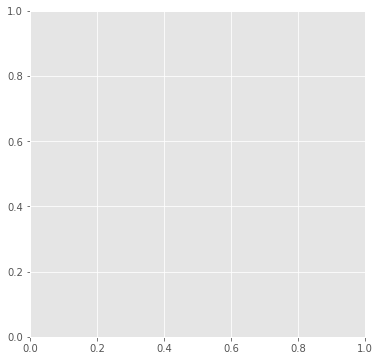

In [55]:
# Placeholder, for when Neighborhood is numbers

x = train['GrLivArea']
y = train['SalePrice']
tag = train['Neighborhood']

    
    # Plot
fig, ax = plt.subplots(1,1, figsize=(6,6))


N = 25 # Number of labels
cmap = plt.cm.jet
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# create the new map
cmap = cmap.from_list('Custom cmap', cmaplist, cmap.N)

# define the bins and normalize
bounds = np.linspace(0,N,N+1)
norm = mpl.colors.BoundaryNorm(bounds, cmap.N)

# make the scatter
scat = ax.scatter(x,y,c=tag,cmap=cmap,norm=norm)
# create the colorbar
cb = plt.colorbar(scat)
cb.set_label('Neighborhood')
ax.set_title('SalePrice vs. Square Footage, by neighborhood')
plt.xlabel('GrLivArea')
plt.ylabel('SalePrice')


plt.show()

In [ ]:
import seaborn as sns
sns.set(style="ticks")


sns.pairplot(num_df)

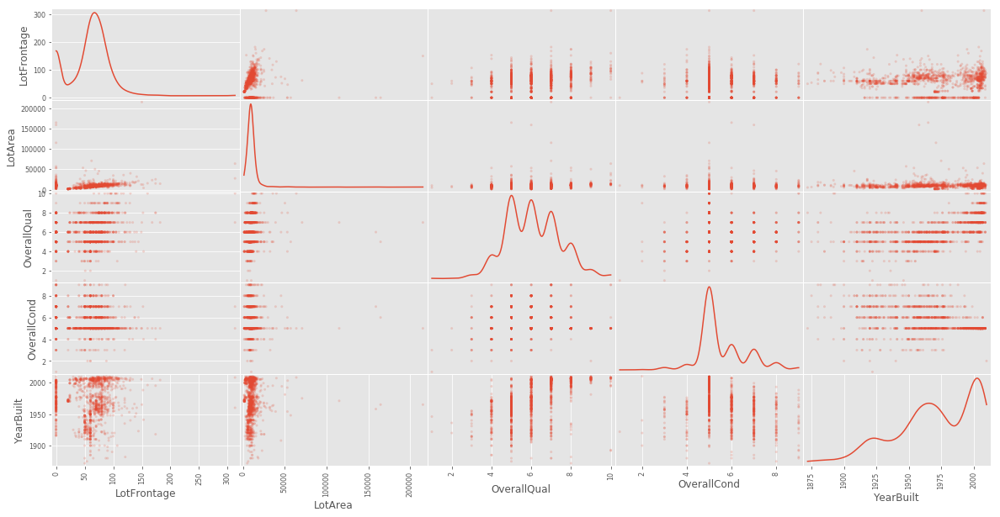

In [6]:
split_size = 5
pd.plotting.scatter_matrix(num_df.iloc[:, 0:split_size], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

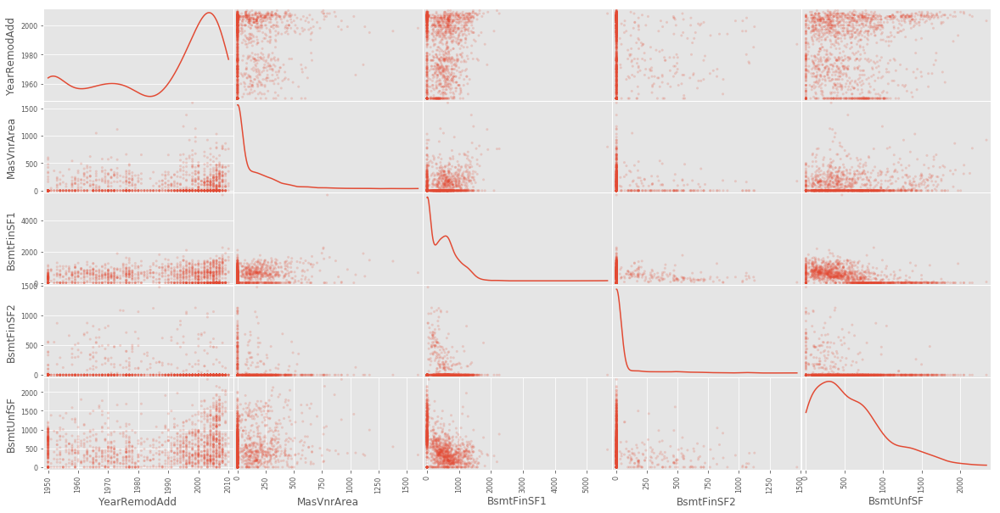

In [8]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size:split_size*2], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

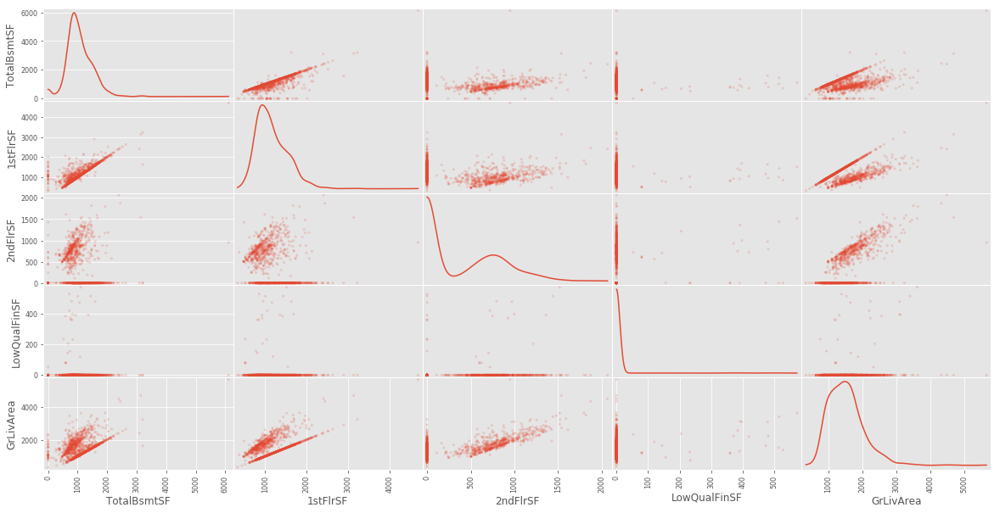

In [9]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*2:split_size*3], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

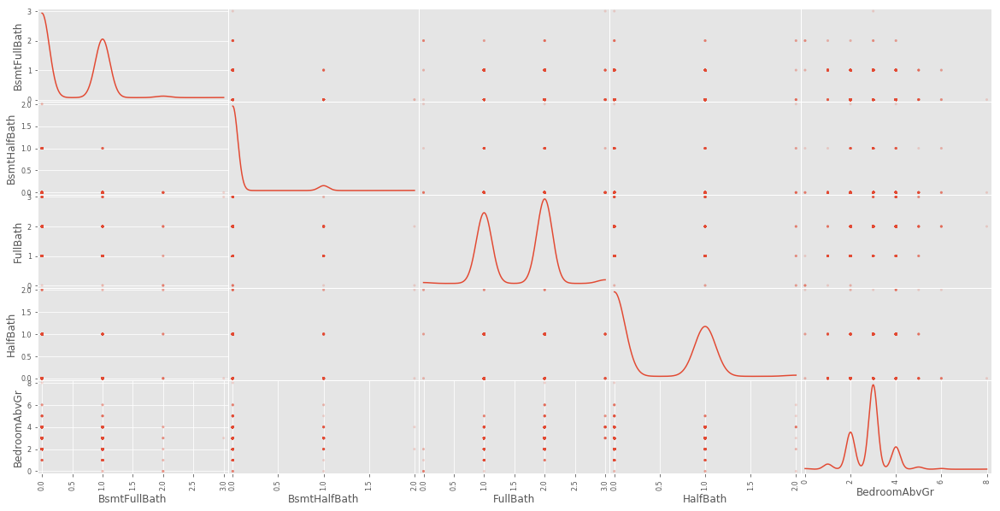

In [10]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*3:split_size*4], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

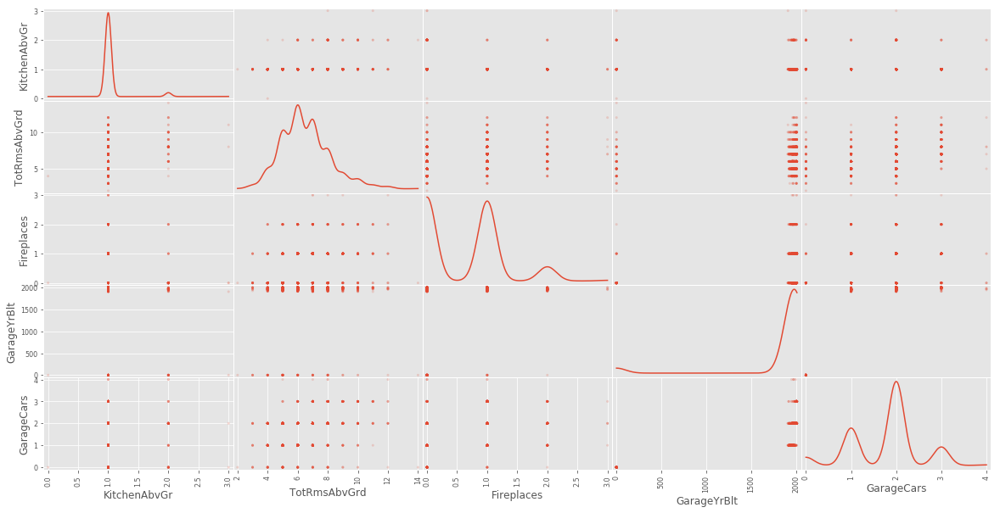

In [11]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*4:split_size*5], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

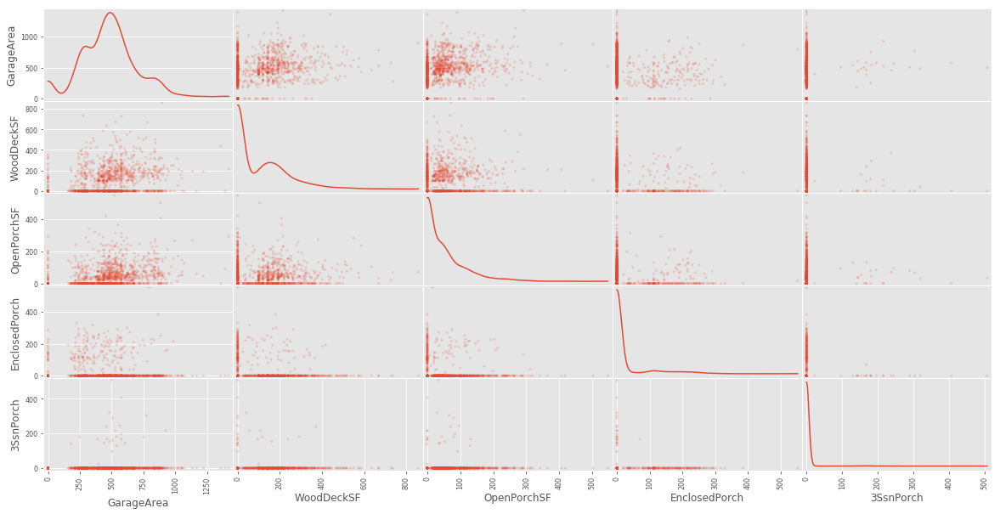

In [12]:
pd.plotting.scatter_matrix(num_df.iloc[:,split_size*5:split_size*6], alpha=0.2, diagonal='kde', figsize=(20,10), grid=True)
plt.show()

In [29]:
cat_values = [x for x in train.columns if x not in num_df.columns]
cat_df = train[cat_values]
#cat_df.isnull().sum()

In [30]:
cat_df.iloc[:,0:(len(cat_values))]



,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,SecondFloor
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,0,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal,1
2,20,RL,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal,0
3,60,RL,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal,1
4,70,RL,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,0,0,0,WD,Abnorml,1
5,60,RL,Pave,0,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal,1
6,50,RL,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,Wood,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,0,Attchd,Unf,TA,TA,Y,0,MnPrv,Shed,WD,Normal,1
7,20,RL,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,Stone,Gd,TA,PConc,Ex,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,0,0,0,WD,Normal,0
8,60,RL,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,Stone,TA,TA,CBlock,Gd,TA,Mn,ALQ,BLQ,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,0,0,Shed,WD,Normal,1
9,50,RM,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,Gable,CompShg,BrkFace,Wd Shng,None,TA,TA,BrkTil,TA,TA,No,Unf,Unf,GasA,Gd,Y,FuseF,TA,Min1,TA,Detchd,Unf,Fa,TA,Y,0,0,0,WD,Abnorml,1


In [15]:
train.corr()['SalePrice']

MSSubClass      -0.087487
LotFrontage      0.214273
LotArea          0.264715
OverallQual      0.789031
OverallCond     -0.089084
YearBuilt        0.517602
YearRemodAdd     0.501186
MasVnrArea       0.471056
BsmtFinSF1       0.384475
BsmtFinSF2      -0.014145
BsmtUnfSF        0.216152
TotalBsmtSF      0.612088
1stFlrSF         0.603300
2ndFlrSF         0.319774
LowQualFinSF    -0.018755
GrLivArea        0.708658
BsmtFullBath     0.224054
BsmtHalfBath    -0.017561
FullBath         0.556674
HalfBath         0.280882
BedroomAbvGr     0.162008
KitchenAbvGr    -0.137825
TotRmsAbvGrd     0.533355
Fireplaces       0.463264
GarageYrBlt      0.258923
GarageCars       0.642135
GarageArea       0.629831
WoodDeckSF       0.320770
OpenPorchSF      0.329491
EnclosedPorch   -0.120765
3SsnPorch        0.043807
ScreenPorch      0.110540
PoolArea         0.092396
MiscVal         -0.021052
MoSold           0.051987
YrSold          -0.025391
SalePrice        1.000000
Name: SalePrice, dtype: float64

In [16]:
train.corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.215415,-0.139725,0.028891,-0.063504,0.030056,0.035989,0.023617,-0.074762,-0.065991,-0.139862,-0.242933,-0.256336,0.304606,0.049734,0.069245,0.004554,-0.011513,0.127755,0.178640,-0.030009,0.274877,0.034751,-0.049409,-0.084350,-0.042209,-0.100045,-0.012677,-0.002789,-0.011016,-0.044032,-0.030057,0.008308,-0.007172,-0.015808,-0.019356,-0.087487
LotFrontage,-0.215415,1.000000,0.100273,0.183681,-0.049826,0.041029,0.081961,0.106697,0.079165,-0.008637,0.159562,0.239862,0.247524,0.044531,0.042045,0.223062,0.012828,-0.027684,0.123610,-0.011265,0.147850,0.035006,0.223205,0.046450,0.023311,0.166719,0.201015,-0.015127,0.072127,0.025923,0.023823,0.023599,0.114483,-0.060943,0.017440,-0.013954,0.214273
LotArea,-0.139725,0.100273,1.000000,0.106457,-0.006074,0.012958,0.013475,0.103071,0.214794,0.111037,-0.003035,0.261034,0.299984,0.051568,0.006429,0.264359,0.158232,0.049121,0.126324,0.013691,0.120122,-0.017014,0.190489,0.271941,0.072148,0.154124,0.179251,0.171632,0.087333,-0.016954,0.020349,0.043435,0.077652,0.037468,0.001500,-0.013579,0.264715
OverallQual,0.028891,0.183681,0.106457,1.000000,-0.107874,0.567392,0.544850,0.405799,0.235139,-0.062980,0.313101,0.536622,0.472004,0.295153,-0.016250,0.591722,0.107451,-0.043259,0.544777,0.270713,0.091649,-0.189207,0.426924,0.391760,0.286571,0.602533,0.570620,0.234394,0.320894,-0.104417,0.029411,0.062759,0.065112,-0.030910,0.078088,-0.024962,0.789031
OverallCond,-0.063504,-0.049826,-0.006074,-0.107874,1.000000,-0.390446,0.067475,-0.130376,-0.053095,0.038818,-0.135607,-0.177514,-0.152497,0.025345,0.050366,-0.086680,-0.057456,0.116901,-0.206639,-0.066594,0.004918,-0.090796,-0.064277,-0.030312,-0.016690,-0.194190,-0.158068,-0.008204,-0.034037,0.079229,0.025010,0.053216,-0.002421,0.069996,0.003308,0.046202,-0.089084
YearBuilt,0.030056,0.041029,0.012958,0.567392,-0.390446,1.000000,0.590105,0.308690,0.248222,-0.052726,0.150407,0.390050,0.277341,0.010472,-0.180007,0.196822,0.181910,-0.035431,0.465918,0.239575,-0.077527,-0.173492,0.095055,0.141373,0.269187,0.538183,0.484036,0.220369,0.197950,-0.380911,0.030387,-0.051326,0.004250,-0.034681,0.017254,-0.009111,0.517602
YearRemodAdd,0.035989,0.081961,0.013475,0.544850,0.067475,0.590105,1.000000,0.173008,0.123137,-0.070913,0.182766,0.285987,0.233655,0.138260,-0.065412,0.281259,0.115609,-0.016507,0.432980,0.180705,-0.050315,-0.155683,0.187457,0.104571,0.145717,0.421333,0.377573,0.201867,0.237689,-0.187094,0.044605,-0.042288,0.005259,-0.009716,0.023540,0.040420,0.501186
MasVnrArea,0.023617,0.106697,0.103071,0.405799,-0.130376,0.308690,0.173008,1.000000,0.260390,-0.072568,0.114022,0.358716,0.338169,0.173841,-0.067594,0.387628,0.080834,0.028291,0.270862,0.197571,0.100638,-0.037786,0.279355,0.244874,0.131776,0.362184,0.373735,0.157778,0.126115,-0.106982,0.018708,0.062015,0.011671,-0.029415,-0.004747,-0.006922,0.471056
BsmtFinSF1,-0.074762,0.079165,0.214794,0.235139,-0.053095,0.248222,0.123137,0.260390,1.000000,-0.051244,-0.494616,0.521739,0.444455,-0.140691,-0.060309,0.204742,0.651115,0.063363,0.052862,0.001151,-0.114256,-0.086628,0.040615,0.256922,0.115756,0.224263,0.300094,0.203239,0.111795,-0.098826,0.026138,0.059746,0.140668,0.004120,-0.017519,0.018654,0.384475
BsmtFinSF2,-0.065991,-0.008637,0.111037,-0.062980,0.038818,-0.052726,-0.070913,-0.072568,-0.051244,1.000000,-0.209824,0.103774,0.095856,-0.099768,0.017333,-0.010915,0.157870,0.071720,-0.078975,-0.033355,-0.017199,-0.040547,-0.036119,0.045482,0.034156,-0.039772,-0.018797,0.066687,0.003697,0.038838,-0.030235,0.088801,0.041585,0.005015,-0.014277,0.032596,-0.014145


In [17]:
# correlations=train.corr()

# attrs = correlations.iloc[:-1,:-1] 


# threshold = .4
# rel_corrs = (attrs[abs(attrs) > threshold][attrs != 1]).unstack().to_dict()

# unique_corrs = pd.DataFrame(
#     list(set([(tuple(sorted(key)), rel_corrs[key]) 
    
#     for key in rel_corrs])), 
#         columns=['Attribute Pair', 'Correlation'])


# # absolute value and sort
# unique_corrs = unique_corrs.iloc[abs(unique_corrs['Correlation']).argsort()]

# unique_corrs


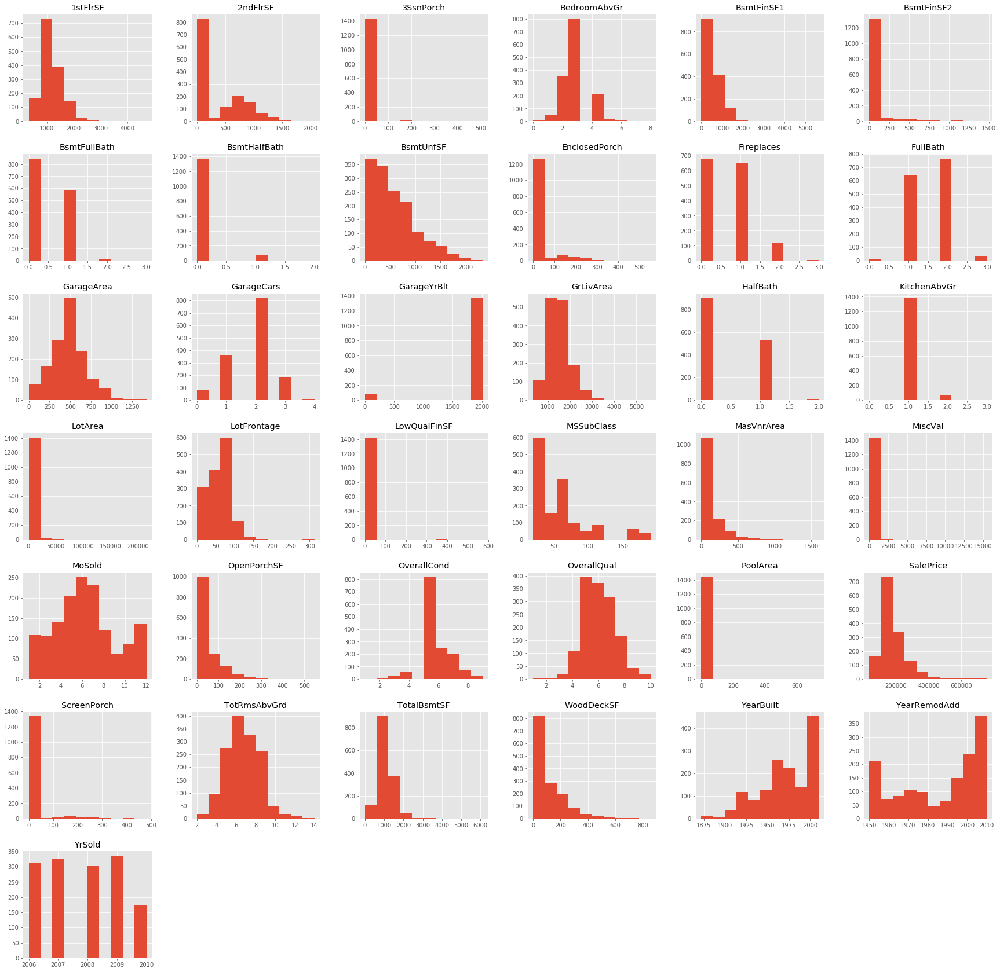

In [18]:
train.hist(figsize=(30,30))

plt.show()

In [19]:
unf_count = train[train['BsmtUnfSF']>0]
len(unf_count)



1333

In [20]:
def make_num(val):
    new_list = []
    if val == 'Ex':
        num = 5
    elif val == 'Gd':
        num = 4
    elif val == 'TA':
        num = 3
    elif val == 'Fa':
        num = 2
    elif val == 'Po':
        num = 1
    else:
        num = 0
    return int(num)

new_dict = {'Kitchen':0, 'Fireplace': 0, 'GarageQ': 0, 'GarageC':0, 'ExterQ': 0, 'ExterC':0, 'BsmtQ':0, 
            'BsmtC':0, 'HeatingQ': 0, "PoolQ": 0}

name_list = list(new_dict.keys())

orig_list = ["KitchenQual", 'FireplaceQu', 'GarageQual', 'GarageCond', 
 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC',
'PoolQC']

i=0
for thing in orig_list:  
    new_list = list(map(make_num,train[thing]))
    new_dict[name_list[i]] = new_list
    
    i+=1
    
new_df = pd.DataFrame(new_dict)

new_df

,Kitchen,Fireplace,GarageQ,GarageC,ExterQ,ExterC,BsmtQ,BsmtC,HeatingQ,PoolQ
0,4,0,3,3,4,3,4,3,5,0
1,3,3,3,3,3,3,4,3,5,0
2,4,3,3,3,4,3,4,3,5,0
3,4,4,3,3,3,3,3,4,4,0
4,4,3,3,3,4,3,4,3,5,0
5,3,0,3,3,3,3,4,3,5,0
6,4,4,3,3,4,3,5,3,5,0
7,3,3,3,3,3,3,4,3,5,0
8,3,3,2,3,3,3,3,3,4,0
9,3,3,4,3,3,3,3,3,5,0


In [21]:
house = pd.concat([train, new_df], sort=True, axis=1)
house

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Kitchen,Fireplace,GarageQ,GarageC,ExterQ,ExterC,BsmtQ,BsmtC,HeatingQ,PoolQ
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,0.0,3.0,3.0,4.0,3.0,4.0,3.0,5.0,0.0
1,60.0,RL,65.0,8450.0,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,2003.0,2003.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,8.0,Typ,0.0,0,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0.0,61.0,0.0,0.0,0.0,0.0,0,0,0,0.0,2.0,2008.0,WD,Normal,208500.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,5.0,0.0
2,20.0,RL,80.0,9600.0,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6.0,8.0,1976.0,1976.0,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,TA,6.0,Typ,1.0,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0.0,5.0,2007.0,WD,Normal,181500.0,4.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,5.0,0.0
3,60.0,RL,68.0,11250.0,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7.0,5.0,2001.0,2002.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,Gd,6.0,Typ,1.0,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0.0,42.0,0.0,0.0,0.0,0.0,0,0,0,0.0,9.0,2008.0,WD,Normal,223500.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,0.0
4,70.0,RL,60.0,9550.0,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7.0,5.0,1915.0,1970.0,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,Gd,7.0,Typ,1.0,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0.0,35.0,272.0,0.0,0.0,0.0,0,0,0,0.0,2.0,2006.0,WD,Abnorml,140000.0,4.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,5.0,0.0
5,60.0,RL,84.0,14260.0,Pave,0,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8.0,5.0,2000.0,2000.0,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,Gd,9.0,Typ,1.0,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192.0,84.0,0.0,0.0,0.0,0.0,0,0,0,0.0,12.0,2008.0,WD,Normal,250000.0,3.0,0.0,3.0,3.0,3.0,3.0,4.0,3.0,5.0,0.0
6,50.0,RL,85.0,14115.0,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5.0,5.0,1993.0,1995.0,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732.0,Unf,0.0,64.0,796.0,GasA,Ex,Y,SBrkr,796.0,566.0,0.0,1362.0,1.0,0.0,1.0,1.0,1.0,1.0,TA,5.0,Typ,0.0,0,Attchd,1993.0,Unf,2.0,480.0,TA,TA,Y,40.0,30.0,0.0,320.0,0.0,0.0,0,MnPrv,Shed,700.0,10.0,2009.0,WD,Normal,143000.0,4.0,4.0,3.0,3.0,4.0,3.0,5.0,3.0,5.0,0.0
7,20.0,RL,75.0,10084.0,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8.0,5.0,2004.0,2005.0,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,

In [22]:
for i in cat_df.columns:
    print(i)
    print (cat_df[i].value_counts())
    

MSSubClass
20     534
60     299
50     140
120     87
30      67
160     63
70      59
80      58
90      52
190     29
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
MSZoning
RL    1151
RM     218
FV      65
RH      16
Name: MSZoning, dtype: int64
Street
Pave    1446
Grvl       4
Name: Street, dtype: int64
Alley
0       1361
Grvl      50
Pave      39
Name: Alley, dtype: int64
LotShape
Reg    916
IR1    483
IR2     41
IR3     10
Name: LotShape, dtype: int64
LandContour
Lvl    1305
Bnk      62
HLS      49
Low      34
Name: LandContour, dtype: int64
Utilities
AllPub    1449
NoSeWa       1
Name: Utilities, dtype: int64
LotConfig
Inside     1044
Corner      261
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
LandSlope
Gtl    1375
Mod      62
Sev      13
Name: LandSlope, dtype: int64
Neighborhood
NAmes      225
CollgCr    150
OldTown    112
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes 

In [23]:
nosecond = train[train['2ndFlrSF']!=0]


In [24]:
nosecond.corr()['SalePrice']

MSSubClass      -0.254667
LotFrontage      0.247595
LotArea          0.284283
OverallQual      0.741685
OverallCond     -0.054456
YearBuilt        0.453938
YearRemodAdd     0.448566
MasVnrArea       0.461845
BsmtFinSF1       0.394168
BsmtFinSF2       0.007736
BsmtUnfSF        0.171141
TotalBsmtSF      0.597651
1stFlrSF         0.603710
2ndFlrSF         0.672916
LowQualFinSF     0.021357
GrLivArea        0.735356
BsmtFullBath     0.262475
BsmtHalfBath    -0.006476
FullBath         0.535389
HalfBath         0.348139
BedroomAbvGr     0.233475
KitchenAbvGr    -0.176085
TotRmsAbvGrd     0.533024
Fireplaces       0.455527
GarageYrBlt      0.234438
GarageCars       0.643792
GarageArea       0.638453
WoodDeckSF       0.333980
OpenPorchSF      0.283064
EnclosedPorch   -0.160424
3SsnPorch        0.014324
ScreenPorch      0.110882
PoolArea         0.149257
MiscVal         -0.023677
MoSold           0.026175
YrSold          -0.066299
SalePrice        1.000000
Name: SalePrice, dtype: float64

In [25]:
correlations=nosecond.corr()

attrs = correlations.iloc[:-1,:-1] 
attrs


threshold = -10
important_corrs = (attrs[abs(attrs) > threshold][attrs != 1.0]) \
    .unstack().dropna().to_dict()

unique_important_corrs = pd.DataFrame(
    list(set([(tuple(sorted(key)), important_corrs[key]) \
    for key in important_corrs])), 
        columns=['Attribute Pair', 'Correlation'])

    # sorted by absolute value
unique_important_corrs = unique_important_corrs.iloc[
    abs(unique_important_corrs['Correlation']).argsort()[::-1]]

unique_important_corrs

,Attribute Pair,Correlation
515,"(GarageArea, GarageCars)",0.880463
371,"(1stFlrSF, GrLivArea)",0.878946
616,"(1stFlrSF, TotalBsmtSF)",0.811182
273,"(2ndFlrSF, GrLivArea)",0.801363
239,"(GrLivArea, TotRmsAbvGrd)",0.765653
313,"(GrLivArea, TotalBsmtSF)",0.741608
310,"(2ndFlrSF, TotRmsAbvGrd)",0.660959
95,"(BsmtFinSF1, TotalBsmtSF)",0.651468
284,"(BedroomAbvGr, TotRmsAbvGrd)",0.640658
526,"(BsmtFinSF1, BsmtFullBath)",0.628335


In [26]:
train['SecondFloor']  = [ 1 if x>0 else 0 for x in train['2ndFlrSF'] ]
'''Categorical substitutions yes/no:
Porch , Pool , Garage'''



'Categorical substitutions yes/no:\nPorch , Pool , Garage'

In [27]:
# RecSpace

'''
WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch
'''
# basement
''''''


''

In [28]:
train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,SecondFloor
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,0,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,0,0,0,0,2,2008,WD,Normal,208500,1
2,20,RL,80.0,9600,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,0,0,0,0,5,2007,WD,Normal,181500,0
3,60,RL,68.0,11250,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,0,0,0,0,9,2008,WD,Normal,223500,1
4,70,RL,60.0,9550,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,0,0,0,0,2,2006,WD,Abnorml,140000,1
5,60,RL,84.0,14260,Pave,0,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,0,0,0,0,12,2008,WD,Normal,250000,1
6,50,RL,85.0,14115,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,0,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,0,MnPrv,Shed,700,10,2009,WD,Normal,143000,1
7,20,RL,75.0,10084,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,0,0,0,0,8,2007,WD,Normal,307000,0
8,60,RL,0.0,10382,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,0,0,Shed,350,11,2009,WD,Normal,200000,1
9,50,RM,51.0,6120,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,0,0,0,0,4,2008,WD,Abnorml,129900,1
